# Step3: Integration of Arima and Cell atlases

Comparison of public systems and developed organoid

In [36]:
suppressPackageStartupMessages({
    library(Seurat)
    library(SeuratDisk)
    library(RColorBrewer)
    library(SCP)
    #library(SeuratData)
    library(patchwork)
    library(ggplot2)
    library(cowplot)
    #theme_set(theme_cowplot())
    library(Matrix)
    library(SeuratWrappers)
    library(dplyr)
    #library(reticulate)
    #library(MAST)
    #library(velocyto.R)
    #library(monocle3)
    #library(magrittr)
})
options(warn=-1)

set.seed(23)

setwd("/work3/SingleCell/Arima")
options(stringsAsFactors = F)
source("src/functions_nagai.R")

In [2]:
color_palette1 <- brewer.pal(7, "Dark2")
color_palette2 <- brewer.pal(12, "Paired")
color_palette <- c(color_palette1, color_palette2)
color_palette
length(color_palette)

[1] "#1B9E77" "#D95F02" "#7570B3" "#E7298A" "#66A61E" "#E6AB02" "#A6761D"
 [8] "#A6CEE3" "#1F78B4" "#B2DF8A" "#33A02C" "#FB9A99" "#E31A1C" "#FDBF6F"
[15] "#FF7F00" "#CAB2D6" "#6A3D9A" "#FFFF99" "#B15928"

[1] 19

In [3]:
#load arima
ari_org_integrated <- readRDS("data/ari_org/ari_org_integrated.rds")
ari_org_integrated$project <- "ari_org"

In [4]:
ari_org_integrated
head(ari_org_integrated@meta.data)

An object of class Seurat 
81018 features across 17537 samples within 3 assays 
Active assay: integrated (24081 features, 3000 variable features)
 2 other assays present: RNA, SCT
 3 dimensional reductions calculated: pca, umap, tsne

,orig.ident,nCount_RNA,nFeature_RNA,percent_mt,percent_rb,nUMI,S.Score,G2M.Score,Phase,old.ident,⋯,integrated_snn_res.0.5,integrated_snn_res.0.6,integrated_snn_res.0.7,integrated_snn_res.0.8,integrated_snn_res.0.9,integrated_snn_res.1,seurat_clusters,clusters,sample,project
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<chr>
AAACCCAAGAACCCGA-1_1,Arima_Pre1_con,8096,3786,0.04940711,0,8096,-0.01967306,0.002771246,G2M,Arima_Pre1_con,⋯,7,8,9,11,12,13,13,9,Arima_Pre1_con,ari_org
AAACCCAAGACATCAA-1_1,Arima_Pre1_con,6645,3199,0.01504891,0,6645,-0.08207534,-0.144767290,G1,Arima_Pre1_con,⋯,4,3,3,3,3,2,2,3,Arima_Pre1_con,ari_org
AAACCCAAGCGACCCT-1_1,Arima_Pre1_con,8680,4231,0.00000000,0,8680,-0.24895522,-0.045133057,G1,Arima_Pre1_con,⋯,4,3,3,3,3,2,2,3,Arima_Pre1_con,ari_org
AAACCCACAACGCCCA-1_1,Arima_Pre1_con,3434,2203,0.02912056,0,3434,-0.08238806,-0.034318665,G1,Arima_Pre1_con,⋯,0,1,1,0,0,0,0,1,Arima_Pre1_con,ari_org
AAACCCACATACCAGT-1_1,Arima_Pre1_con,7236,3560,0.00000000,0,7236,-0.13692964,0.007138058,G2M,Arima_Pre1_con,⋯,2,2,6,7,10,11,11,6,Arima_Pre1_con,ari_org
AAACCCACATGGTACT-1_1,Arima_Pre1_con,6897,3404,0.05799623,0,6897,-0.06065387,0.014416079,G2M,Arima_Pre1_con,⋯,0,0,0,0,0,0,0,0,Arima_Pre1_con,ari_org


In [5]:
# Assign clusters as celltype for further comparison
table(ari_org_integrated$integrated_snn_res.0.7)
ari_org_integrated$clusters <- ari_org_integrated$integrated_snn_res.0.7
ari_org_integrated$celltype <- ari_org_integrated$integrated_snn_res.0.7
Idents(object = ari_org_integrated) <- ari_org_integrated$clusters


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14 
3756 2389 1931 1657 1654 1387 1262  816  779  614  426  336  253  209   68 

#### 1. Wang et al., in vivo endometrial dataset

In [ ]:
#load Wang, Nat Medicine, 2020 in vitro
wg_vv.downsized <- readRDS(file = "data/wg_vv/processed/wg_vv.downsized.rds")
wg_vv.downsized
wg_vv.downsized$project <- "wg_vv"
wg_vv.downsized$celltype <- wg_vv.downsized$cell_type
head(wg_vv.downsized@meta.data)

An object of class Seurat 
60424 features across 17537 samples within 2 assays 
Active assay: SCT (26886 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

,orig.ident,nCount_RNA,nFeature_RNA,donor,day,cell_type,cell_name,phase_canonical,percent_mt,percent_rb,nCount_SCT,nFeature_SCT,SCT_snn_res.0.1,SCT_snn_res.0.3,SCT_snn_res.0.5,SCT_snn_res.0.8,seurat_clusters,project,nUMI,celltype
,<fct>,<dbl>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<dbl>,<chr>
29_TGTGATGTCCGTGACG,29,5410,2012,29,20,Unciliated epithelia 1,29_TGTGATGTCCGTGACG,secretory_early-mid,15.246479,11.76056,5680,2012,0,1,0,1,1,wg_vv,5410,Unciliated epithelia 1
58_GCAGTTATCACCTTAT,58,12110,3694,58,20,Stromal fibroblasts,58_GCAGTTATCACCTTAT,secretory_early,3.328096,22.86816,7001,3367,1,2,2,8,8,wg_vv,12110,Stromal fibroblasts
19_CAGAGCCTCATGAGGG,19,17950,3776,19,22,Unciliated epithelia 2,19_CAGAGCCTCATGAGGG,proliferative,6.637737,26.35808,6222,2178,2,9,8,22,22,wg_vv,17950,Unciliated epithelia 2
20_GTAGCTAGTGTTCGAT,20,24231,4445,20,22,Unciliated epithelia 1,20_GTAGCTAGTGTTCGAT,secretory_mid,15.207523,11.75422,6168,2075,6,4,4,4,4,wg_vv,24231,Unciliated epithelia 1
29_TTTCGATCACGCAGTC,29,4746,1825,29,20,Unciliated epithelia 2,29_TTTCGATCACGCAGTC,secretory_early-mid,11.009677,18.38598,5477,1825,0,0,1,0,0,wg_vv,4746,Unciliated epithelia 2
39_TGCTGAACACTTGAAC,39,5914,1998,39,23,Stromal fibroblasts,39_TGCTGAACACTTGAAC,secretory_early-mid,3.076923,34.09975,5915,1998,1,6,5,3,3,wg_vv,5914,Stromal fibroblasts


In [ ]:
print(paste0("Number of cells in this experiment: ", ncol(x = wg_vv.downsized)))
print(paste0("Number of features identified: ", nrow(x = wg_vv.downsized)))

[1] "Number of cells in this experiment: 17537"
[1] "Number of features identified: 26886"


In [13]:
# Reference: 
markers = c("EPCAM", "SOX9", "MMP7",             #SOX9
            "LGR5", "PTGS1",                     #Lumenal
            "SCGB2A2", "SLC18A2", "PAEP",        #Glandular
            "FOXJ1", "PIFO",                     #Ciliated
            "ACTA2", "MYH11", "LEFTY2", "ACTG2", #uSMC
            "RGS5", "NTRK2", "FHL5",             #PV MYH11
            "GUCY1A2", "STEAP4", "IGF1", "PCOLCE", #PV STEAP4
            "C7", "OGN",                         #Fibroblast C7
            "MMP11", "SFRP1",                    #eS
            "DKK1", "FOXO1",                     #dS
            "CD34", "SEMA3G", "GJA5",            #Endothelial artery
            "ACKR1", "PLVAP",                    #Endothelial vein
            "PTPRC", "CD3G", "NCAM1",             #Lymphoid
            "CD14", "CSF1R")                     #Myeloid

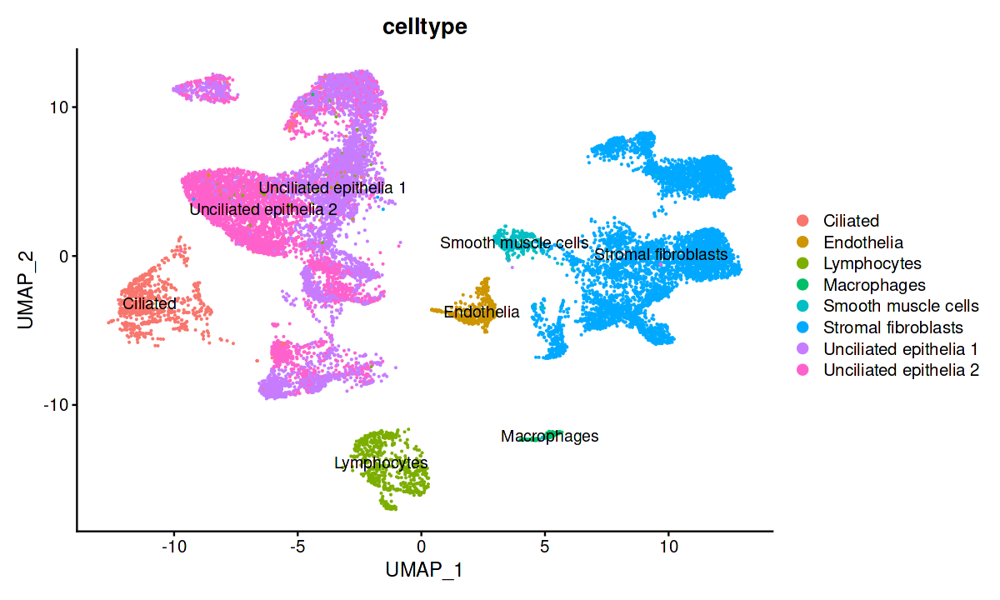

In [14]:
# Downsized dataset
plot.width = 10
plot.height = 6
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(wg_vv.downsized, reduction = "umap", group.by = "celltype", label = TRUE)

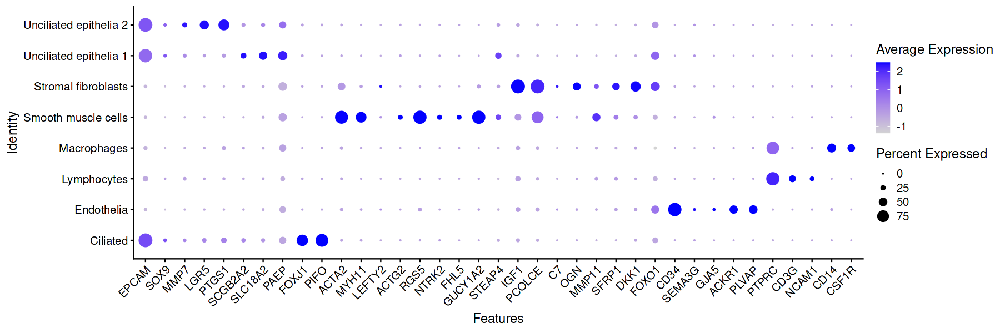

In [15]:
plot.width = 15
plot.height = 5
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DotPlot(wg_vv.downsized, features = markers, group.by = "celltype") + RotatedAxis()
ggsave(file="results/2023-03/dotplot_wg_vv_known_markers.pdf", width = plot.width, height = plot.height)

#### 2. Garcia-Alonso et al., endometrial dataset

In [16]:
#load Garcia-Alonso in vitro
ga_vv.downsized <- readRDS(file = "data/ga_vv/processed/ga_vv.downsized.rds")
ga_vv.downsized
ga_vv.downsized$project <- "ga_vv"
ga_vv.downsized$celltype <- ga_vv.downsized$Cell.type
#ga_vv.downsized$celltype <- ga_vv.downsized$Broad.cell.type	
head(ga_vv.downsized@meta.data)

An object of class Seurat 
28614 features across 17537 samples within 1 assay 
Active assay: RNA (28614 features, 0 variable features)
 1 dimensional reduction calculated: umap_scvi_sampl_cc

,SampleID,log2p1_count,percent_mito,n_genes,DonorID,BiopsyType,Location,Binary.Stage,Stage,Broad.cell.type,Cell.type,CellCycle.Phase,project,nCount_RNA,nFeature_RNA,celltype
,<fct>,<dbl>,<dbl>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<dbl>,<int>,<fct>
4861STDY7387181_TCATTACCAATGTTGC,4861STDY7387181,13.74462,0.05675774,4237,A13,Organ_Donor,endometrium_enriched,Proliferative,proliferative,Stromal,eS,G2M,ga_vv,13725,4237,eS
4861STDY7387182_CGTTAGACACTCTGTC,4861STDY7387182,12.94251,0.05831533,2502,A13,Organ_Donor,endometrium_enriched,Proliferative,proliferative,Stromal,eS,G1,ga_vv,7871,2502,eS
4861STDY7771123_GTACTTTGTATCACCA,4861STDY7771123,12.49710,0.02145329,2134,A30,Organ_Donor,endometrium_enriched,Secretory,early-secretory,Endothelial,Endothelial ACKR1,G1,ga_vv,5780,2134,Endothelial ACKR1
MRC_Endo8625699_CACGTGGTCTTCCCGA,MRC_Endo8625699,13.53625,0.08999074,3079,E1,Superficial_Biopsy,endometrium_biopsy,Secretory,late-secretory,Stromal,eS,G1,ga_vv,11879,3079,eS
MRC_Endo8712032_ATACCGACATTGCCTC,MRC_Endo8712032,14.88941,0.06797588,5451,E2,Superficial_Biopsy,endometrium_biopsy,Secretory,mid-secretory,Stromal,eS,G1,ga_vv,30349,5451,eS
GSM4577308_TGTCCACTCCGATGCG,GSM4577308,14.01907,0.04047949,3555,SAMN15049049,Superficial_Biopsy,endometrium_biopsy,Secretory,mid-secretory,Stromal,dS,G1,ga_vv,16601,3555,dS


In [17]:
head(ga_vv.downsized@meta.data)

,SampleID,log2p1_count,percent_mito,n_genes,DonorID,BiopsyType,Location,Binary.Stage,Stage,Broad.cell.type,Cell.type,CellCycle.Phase,project,nCount_RNA,nFeature_RNA,celltype
,<fct>,<dbl>,<dbl>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<chr>,<dbl>,<int>,<fct>
4861STDY7387181_TCATTACCAATGTTGC,4861STDY7387181,13.74462,0.05675774,4237,A13,Organ_Donor,endometrium_enriched,Proliferative,proliferative,Stromal,eS,G2M,ga_vv,13725,4237,eS
4861STDY7387182_CGTTAGACACTCTGTC,4861STDY7387182,12.94251,0.05831533,2502,A13,Organ_Donor,endometrium_enriched,Proliferative,proliferative,Stromal,eS,G1,ga_vv,7871,2502,eS
4861STDY7771123_GTACTTTGTATCACCA,4861STDY7771123,12.49710,0.02145329,2134,A30,Organ_Donor,endometrium_enriched,Secretory,early-secretory,Endothelial,Endothelial ACKR1,G1,ga_vv,5780,2134,Endothelial ACKR1
MRC_Endo8625699_CACGTGGTCTTCCCGA,MRC_Endo8625699,13.53625,0.08999074,3079,E1,Superficial_Biopsy,endometrium_biopsy,Secretory,late-secretory,Stromal,eS,G1,ga_vv,11879,3079,eS
MRC_Endo8712032_ATACCGACATTGCCTC,MRC_Endo8712032,14.88941,0.06797588,5451,E2,Superficial_Biopsy,endometrium_biopsy,Secretory,mid-secretory,Stromal,eS,G1,ga_vv,30349,5451,eS
GSM4577308_TGTCCACTCCGATGCG,GSM4577308,14.01907,0.04047949,3555,SAMN15049049,Superficial_Biopsy,endometrium_biopsy,Secretory,mid-secretory,Stromal,dS,G1,ga_vv,16601,3555,dS


In [18]:
print(paste0("Number of cells in this experiment: ", ncol(x = ga_vv.downsized)))
print(paste0("Number of features identified: ", nrow(x = ga_vv.downsized)))

[1] "Number of cells in this experiment: 17537"
[1] "Number of features identified: 28614"


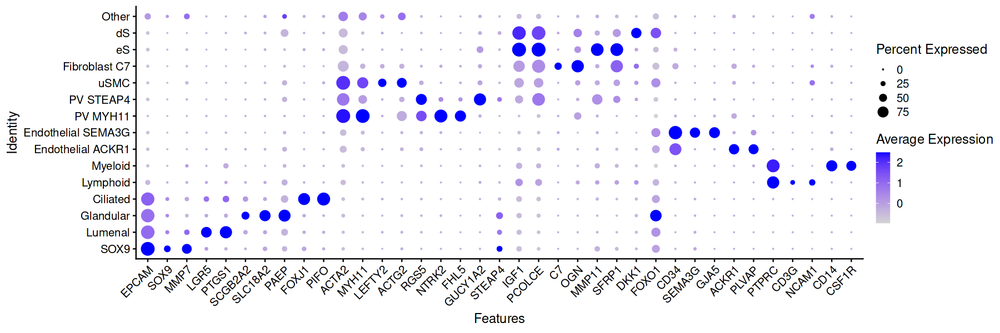

In [19]:
plot.width = 15
plot.height = 5
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DotPlot(ga_vv.downsized, features = markers, group.by = "celltype") + RotatedAxis()
#ggsave(file="results/2023-01/ari_org_dotplot_by_clusters.pdf", width = plot.width, height = plot.height)

#### 3. Garcia-Alonso et al., organoid dataset

In [20]:
#load Garcia-Alonso in vitro
ga_org.downsized <- readRDS(file = "data/ga_org/processed/ga_org.downsized.rds")
ga_org.downsized
ga_org.downsized$project <- "ga_org"
ga_org.downsized$celltype <- ga_org.downsized$Celltype
head(ga_org.downsized@meta.data)

An object of class Seurat 
27254 features across 17537 samples within 1 assay 
Active assay: RNA (27254 features, 0 variable features)
 2 dimensional reductions calculated: umap, umap_without_inhibitors

,demultiplexed,sample_names,log2p1_count,percent_mito,n_genes,Days,Hormones,Inhibitor,IsClonal,Celltype_without_inhibitors,Celltype,CellCycle.Phase,project,nCount_RNA,nFeature_RNA,celltype
,<fct>,<fct>,<dbl>,<dbl>,<int>,<fct>,<fct>,<fct>,<lgl>,<fct>,<fct>,<fct>,<chr>,<dbl>,<int>,<fct>
WSSS_END9397528_GTCGAATGTCCAGAAG,B44,WSSS_END9397528,12.69870,0.12968257,2189,6,Ctrl,Ctrl,FALSE,NH_Day6,NH_d2_d6,G1,ga_org,6647,2189,NH_d2_d6
WSSS_END9397535_GTCGTAACATGACAAA,B44,WSSS_END9397535,13.27263,0.12764022,2952,6,E+P,WNT-XAV,FALSE,filtered,Secretory_WNTi,G1,ga_org,9895,2952,Secretory_WNTi
WSSS_END9397520_GATCACAAGGTAGCAC,U2,WSSS_END9397520,12.64047,0.11889098,2217,0,Ctrl,Ctrl,FALSE,NH_Day0,NH_d0,G1,ga_org,6384,2217,NH_d0
WSSS_END9397533_AGAGAATGTTACTCAG,U1,WSSS_END9397533,13.03153,0.11741520,2520,6,E+P,Ctrl,FALSE,Secretory,Secretory_Ctrl,G1,ga_org,8372,2520,Secretory_Ctrl
WSSS_END9397531_TCGGGCAGTCAAGGCA,B44,WSSS_END9397531,12.69436,0.11951109,2227,6,E+P,WNT-XAV,FALSE,filtered,Estrogen_induced_PGR+,G1,ga_org,6627,2227,Estrogen_induced_PGR+
WSSS_END9397523_AACCCAAGTGAGGATC,U1,WSSS_END9397523,14.35308,0.07215904,4770,2,E,NOTCH-DBZ,FALSE,filtered,Pre-ciliated,G1,ga_org,20926,4770,Pre-ciliated


In [21]:
print(paste0("Number of cells in this experiment: ", ncol(x = ga_org.downsized)))
print(paste0("Number of features identified: ", nrow(x = ga_org.downsized)))

[1] "Number of cells in this experiment: 17537"
[1] "Number of features identified: 27254"


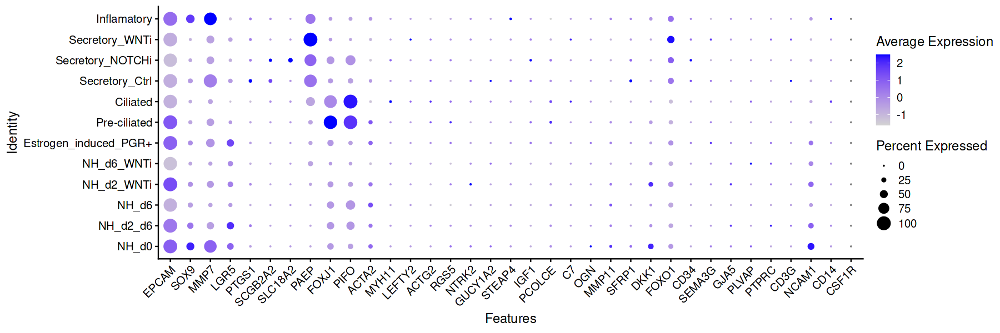

In [22]:
plot.width = 15
plot.height = 5
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DotPlot(ga_org.downsized, features = markers, group.by = "celltype") + RotatedAxis()
#ggsave(file="results/2023-01/ari_org_dotplot_by_clusters.pdf", width = plot.width, height = plot.height)

### Integration of all samples

In [23]:
# list of all projects to integrate
so.list <- c(ari_org_integrated, wg_vv.downsized, ga_vv.downsized, ga_org.downsized)

In [24]:
# normalize and identify variable features for each dataset independently
so.list <- lapply(X = so.list, FUN = SCTransform)
features <- SelectIntegrationFeatures(object.list = so.list, nfeatures = 3000)
so.list <- PrepSCTIntegration(object.list = so.list, anchor.features = features)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 28103 by 17537

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


There are 1 estimated thetas smaller than 1e-07 - will be set to 1e-07

Found 69 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 28103 genes



  |======================================================================| 100%


Computing corrected count matrix for 28103 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.69777 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 24278 by 17537

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 67 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 24278 genes



  |======================================================================| 100%


Computing corrected count matrix for 24278 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.516335 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 24381 by 17537

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 71 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 24381 genes



  |======================================================================| 100%


Computing corrected count matrix for 24381 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.510557 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 21678 by 17537

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 116 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 21678 genes



  |======================================================================| 100%


Computing corrected count matrix for 21678 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 1.404091 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT



In [25]:
so.anchors <- FindIntegrationAnchors(object.list = so.list, normalization.method = "SCT",
    anchor.features = features)
so.combined.sct <- IntegrateData(anchorset = so.anchors, normalization.method = "SCT")

Finding all pairwise anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 21497 anchors

Filtering anchors

	Retained 7248 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 20588 anchors

Filtering anchors

	Retained 6022 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 33358 anchors

Filtering anchors

	Retained 29015 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 25533 anchors

Filtering anchors

	Retained 10581 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 22904 anchors

Filtering anchors

	Retained 11686 anchors

Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 22888 anchors

Filtering anchors

	Retained 12180 anchors

Merging dataset 3 into 2

Extracting anchors for merged samples

Finding integration vectors

Finding integration vector weights

Integrating data

Merging 

In [26]:
DefaultAssay(so.combined.sct) <- "integrated"

In [27]:
so.combined.sct <- RunPCA(so.combined.sct, verbose = FALSE)
so.combined.sct <- RunTSNE(so.combined.sct)
so.combined.sct <- RunUMAP(so.combined.sct, reduction = "pca", dims = 1:30)

17:27:40 UMAP embedding parameters a = 0.9922 b = 1.112

17:27:40 Read 70148 rows and found 30 numeric columns

17:27:40 Using Annoy for neighbor search, n_neighbors = 30

17:27:40 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:27:51 Writing NN index file to temp file /tmp/Rtmp9aH0sO/file3f89715772087

17:27:51 Searching Annoy index using 1 thread, search_k = 3000

17:28:22 Annoy recall = 100%

17:28:25 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:28:27 Initializing from normalized Laplacian + noise (using irlba)

17:28:29 Commencing optimization for 200 epochs, with 3128520 positive edges

17:28:58 Optimization finished



In [28]:
so.combined.sct <- FindNeighbors(so.combined.sct, reduction = "pca", dims = 1:30)
so.combined.sct <- FindClusters(so.combined.sct, resolution = c(0.1, 0.2, 0.3, 0.5, 0.6, 0.8, 1))

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 70148
Number of edges: 2477186

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9640
Number of communities: 12
Elapsed time: 21 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 70148
Number of edges: 2477186

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9523
Number of communities: 15
Elapsed time: 21 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 70148
Number of edges: 2477186

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9440
Number of communities: 19
Elapsed time: 21 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 70148
Number of edges: 2477186

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9320
Number of communities: 24
Elapsed time: 21 seconds
Modu

In [29]:
table(so.combined.sct$integrated_snn_res.0.3)
Idents(object = so.combined.sct) <- so.combined.sct$integrated_snn_res.0.3


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
8289 7357 6678 5690 5438 5226 4506 4098 3889 3804 3603 3299 2781 1222 1218 1010 
  16   17   18 
 920  776  344 

In [39]:
# Lighter color palette
color_list <- c("#FFB6C1", "#FFA07A", "#FFD700", "#FF69B4", "#FFA07A", "#FF6347", "#F0E68C", "#E6E6FA", "#D8BFD8", 
                 "#FFC0CB", "#C71585", "#BDB76B", "#E0FFFF", "#FF00FF", "#BA55D3", "#FFE4E1", "#F08080", "#ADFF2F", 
                 "#D2B48C", "#FFFACD", "#FFB6C1", "#DDA0DD", "#9370DB", "#F5DEB3", "#FFEBCD", "#F5F5DC", "#ADD8E6", 
                 "#DA70D6", "#F0FFF0", "#F08080", "#00FA9A", "#CD853F", "#FFDEAD", "#EEE8AA", "#98FB98", "#87CEFA", 
                 "#FFC0CB", "#AFEEEE", "#FFE4B5", "#FFDAB9", "#F0F8FF", "#B0E0E6", "#FFE4C4", "#E6E6FA", "#D8BFD8", 
                 "#FFC0CB", "#C71585", "#BDB76B", "#E0FFFF", "#FF00FF", "#BA55D3", "#FFE4E1", "#F08080", "#ADFF2F")

# Randomly mix the colors
set.seed(123)
color_list <- sample(color_list)


In [61]:
color_palette1 <- brewer.pal(8, "Dark2")
color_palette2 <- brewer.pal(12, "Paired")
color_palette <- c(color_palette1, color_palette2)
color_palette
length(color_palette)

final_color_palette <- c('#1B9E77','#D95F02','#7570B3',
                         '#E7298A','#66A61E','#E6AB02',
                         '#A6761D','#666666','#A6CEE3',
                         '#1F78B4','#B2DF8A','#33A02C',
                         '#FB9A99','#E31A1C','#FDBF6F',
                         '#FF7F00','#CAB2D6','#B15928',
                         '#6A3D9A','#FFFF99')

[1] "#1B9E77" "#D95F02" "#7570B3" "#E7298A" "#66A61E" "#E6AB02" "#A6761D"
 [8] "#666666" "#A6CEE3" "#1F78B4" "#B2DF8A" "#33A02C" "#FB9A99" "#E31A1C"
[15] "#FDBF6F" "#FF7F00" "#CAB2D6" "#6A3D9A" "#FFFF99" "#B15928"

[1] 20

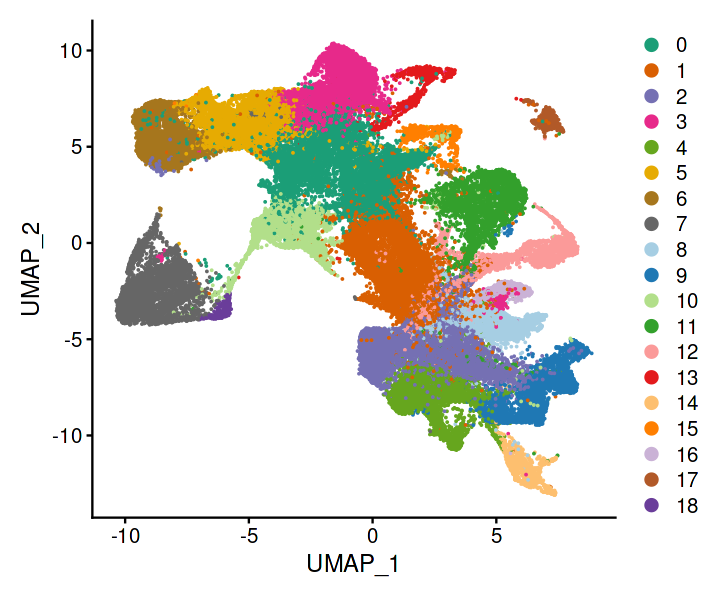

In [62]:
plot.width = 6
plot.height = 5
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "umap", cols = final_color_palette)
ggsave(file="results/2023-04-28/Fig3_G_1_seurat.pdf", width = plot.width, height = plot.height)

Saving 6.67 x 6.67 in image


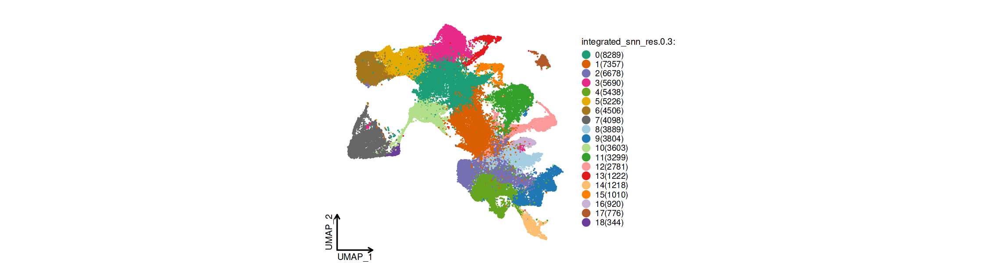

In [71]:
#plot.width = 10
#plot.height = 10
#options(repr.plot.width = plot.width, repr.plot.height = plot.height)

# Using SCP
ClassDimPlot(
  srt = so.combined.sct, group.by = "integrated_snn_res.0.3",
  reduction = "UMAP", theme_use = "theme_blank", 
  palcolor = final_color_palette
)
ggsave(file="results/2023-04-28/Fig3_G_1.pdf")#, width = plot.width, height = plot.height)

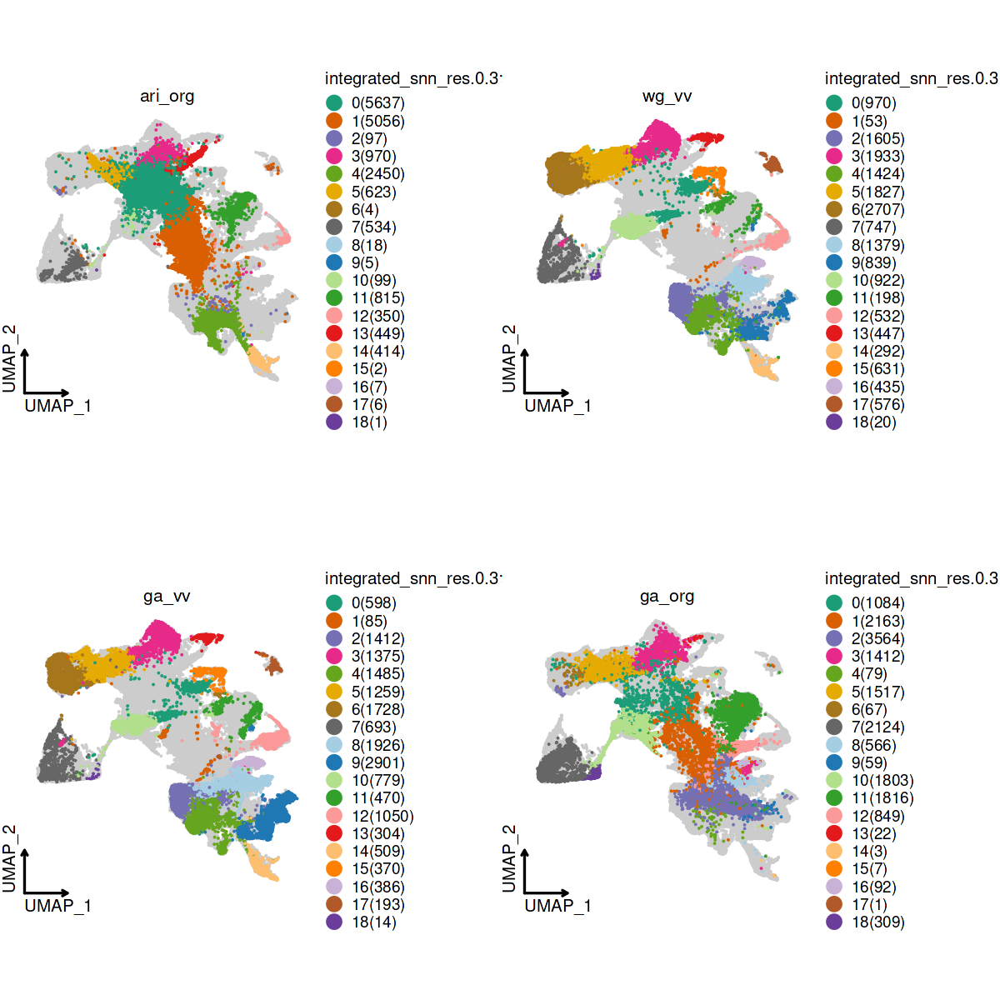

In [74]:
plot.width = 10
plot.height = 10
options(repr.plot.width = plot.width, repr.plot.height = plot.height)

# Using SCP
ClassDimPlot(
  srt = so.combined.sct, group.by = "integrated_snn_res.0.3", split.by = "project", 
  reduction = "UMAP", theme_use = "theme_blank", 
  palcolor = final_color_palette
)
ggsave(file="results/2023-04-28/Fig3_G_2.pdf", width = plot.width, height = plot.height)

Saving 6.67 x 6.67 in image


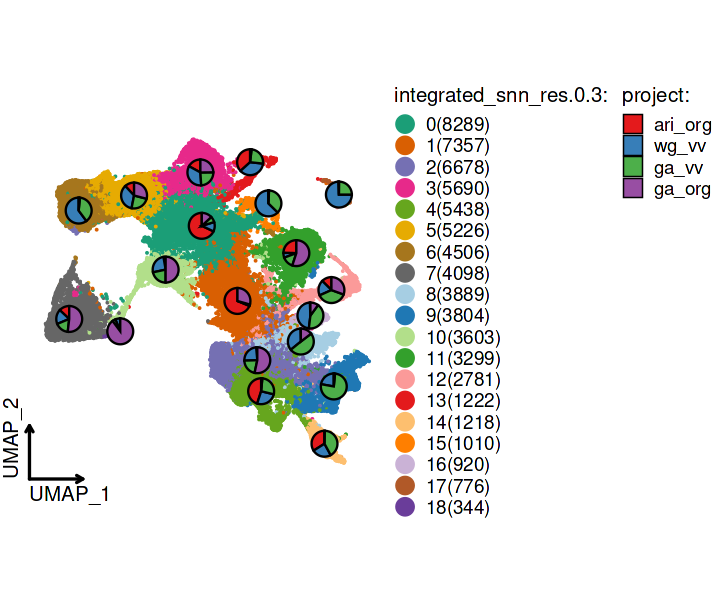

In [64]:
#plot.width = 10
#plot.height = 10
#options(repr.plot.width = plot.width, repr.plot.height = plot.height)

# Using SCP
ClassDimPlot( palcolor = final_color_palette,
  srt = so.combined.sct, group.by = "integrated_snn_res.0.3", stat.by = "project",
  reduction = "UMAP", theme_use = "theme_blank"
)
ggsave(file="results/2023-04-28/integration_all_downsized_umap1_split_2.pdf")#, width = plot.width, height = plot.height)

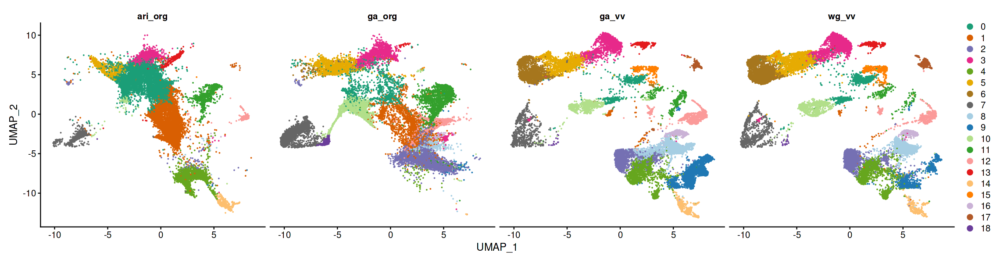

In [65]:
plot.width = 19
plot.height = 5
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "umap", split.by = "project", cols=final_color_palette)
ggsave(file="results/2023-04-28/integration_all_downsized_umap1_split_by_experiment.pdf", width = plot.width, height = plot.height)

In [76]:
# Using the RColorBrewer package
library(RColorBrewer)
color_palette <- brewer.pal(n = 52, name = "Set1")

# Alternatively, using the colorspace packagedd
library(colorspace)
color_palette <- rainbow_hcl(52, c = 100, l = 65)

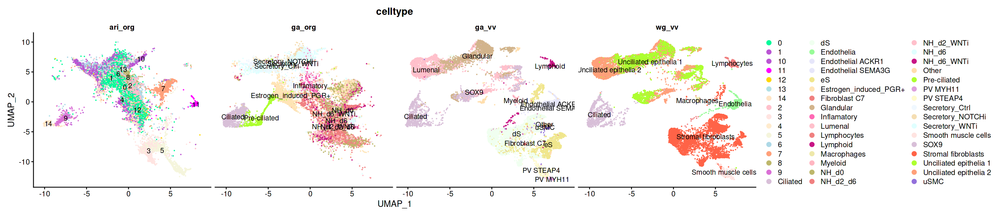

In [78]:
plot.width = 23
plot.height = 5
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "umap", group.by = "celltype", cols=color_list,
        split.by = "project", label = TRUE, repel = FALSE)
ggsave(file="results/2023-03/integration_all_downsized_umap2_split_by_experiment.pdf", width = plot.width, height = plot.height)

In [79]:
colors <- c("#F8766D", "#00BFC4", "#619CFF", "#C77CFF")

Saving 6.67 x 6.67 in image


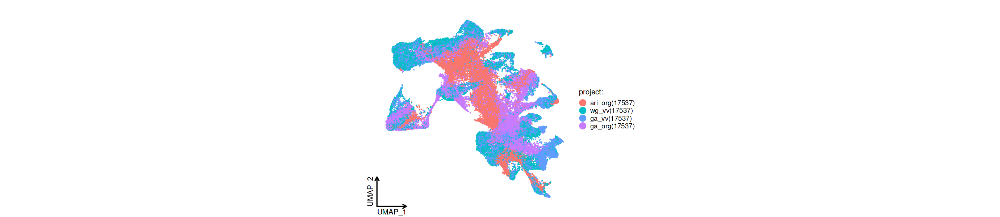

In [80]:
#plot.width = 10
#plot.height = 10
#options(repr.plot.width = plot.width, repr.plot.height = plot.height)

# Using SCP
ClassDimPlot( palcolor = colors,
  srt = so.combined.sct, group.by = "project", #stat.by = "project",
  reduction = "UMAP", theme_use = "theme_blank"
)
ggsave(file="results/2023-03/integration_all_downsized_umap2.pdf")#, width = plot.width, height = plot.height)

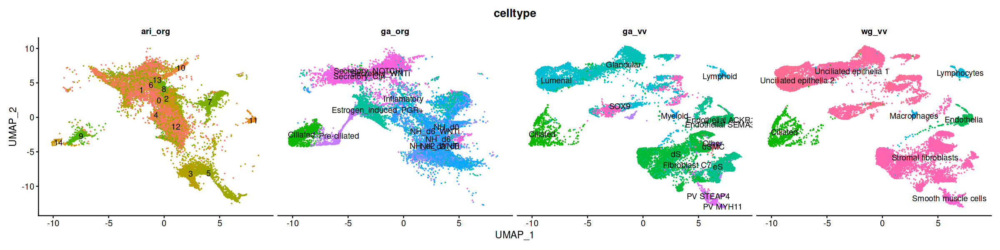

In [81]:
plot.width = 20
plot.height = 5
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "umap", group.by = "celltype", split.by = "project", label = TRUE) + NoLegend()
ggsave(file="results/2023-04-28/integration_all_downsized_umap2_split_by_experiment_with_labels.pdf", width = plot.width, height = plot.height)

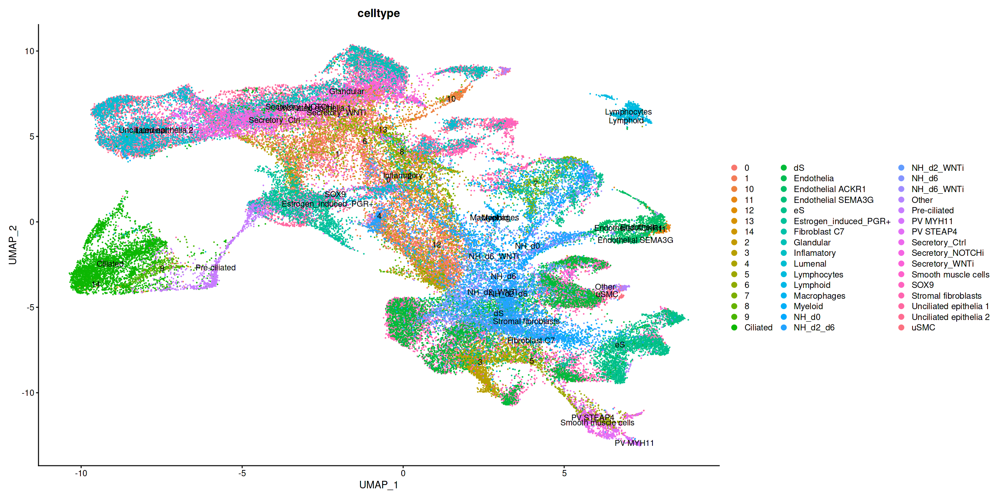

In [82]:
plot.width = 20
plot.height = 10
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "umap", group.by = "celltype", label = TRUE, repel = FALSE)
ggsave(file="results/2023-04-28/integration_all_downsized_umap3.pdf", width = plot.width, height = plot.height)

In [83]:
so.combined.sct$samples <- so.combined.sct$project

## Without batch effect comparison

In [85]:
ari_only.sct <- subset(so.combined.sct, subset = project == "ari_org")
table(ari_only.sct@meta.data$project)


ari_org 
  17537 

In [86]:
org_only.sct <- subset(so.combined.sct, subset = project == c("ari_org", "ga_org"))
table(org_only.sct@meta.data$project)


ari_org  ga_org 
   8769    8769 

In [87]:
vivo_only.sct <- subset(so.combined.sct, subset = project == c("wg_vv", "ga_vv"))
table(vivo_only.sct@meta.data$project)


ga_vv wg_vv 
 8768  8768 

Use the HVF to calculate distance metric.

Use 1409 common features to calculate distance.

Detected query data type: unknown

Detected reference data type: log_normalized_counts

Calculate similarity...

Use 'raw' method to find neighbors.

Predict cell type...



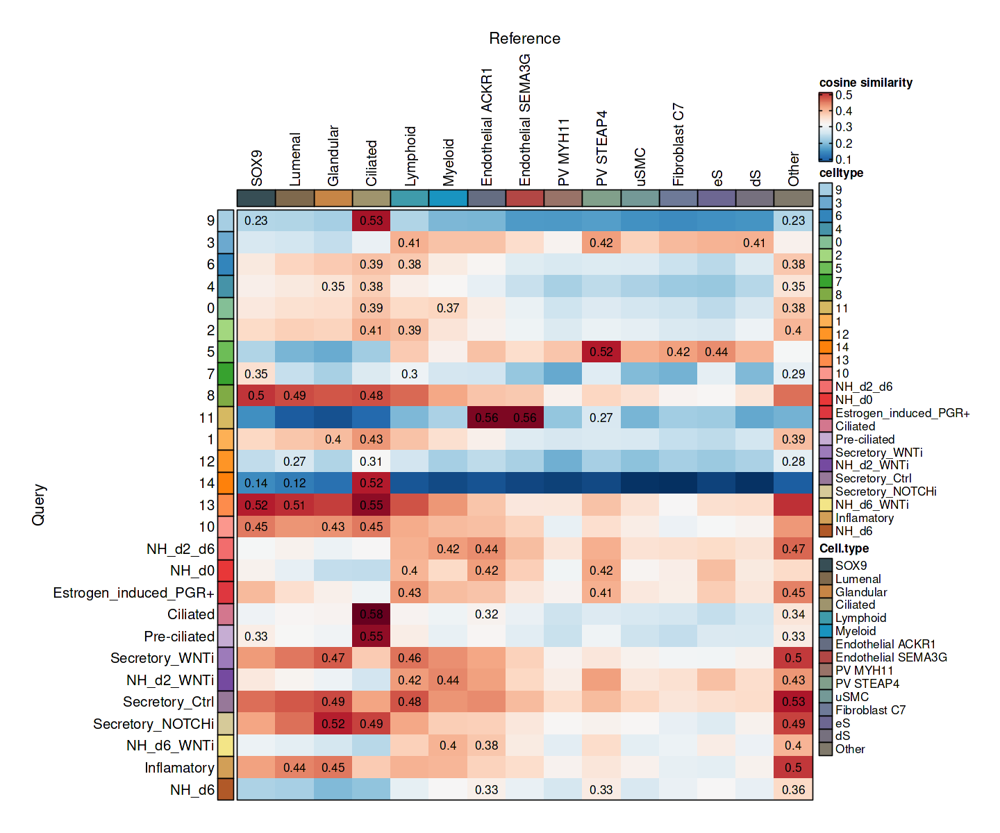

In [89]:
# Calculate score for cosine similarity
ht <- CellCorHeatmap(
  srt_query = org_only.sct, srt_ref = ga_vv.downsized,
  query_group = "celltype", ref_group = "Cell.type",
  nlabel = 3, label_by = "row",
  show_row_names = TRUE, show_column_names = TRUE
)
plot.width = 12
plot.height = 10
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
print(ht$plot)
ggsave(file="results/2023-04-28/heatmap_cosine_distance_org_ga_vv_ref.pdf", width = plot.width, height = plot.height)

Use the HVF to calculate distance metric.

Use 1975 common features to calculate distance.

Detected query data type: unknown

Detected reference data type: log_normalized_counts

Calculate similarity...

Use 'raw' method to find neighbors.

Predict cell type...



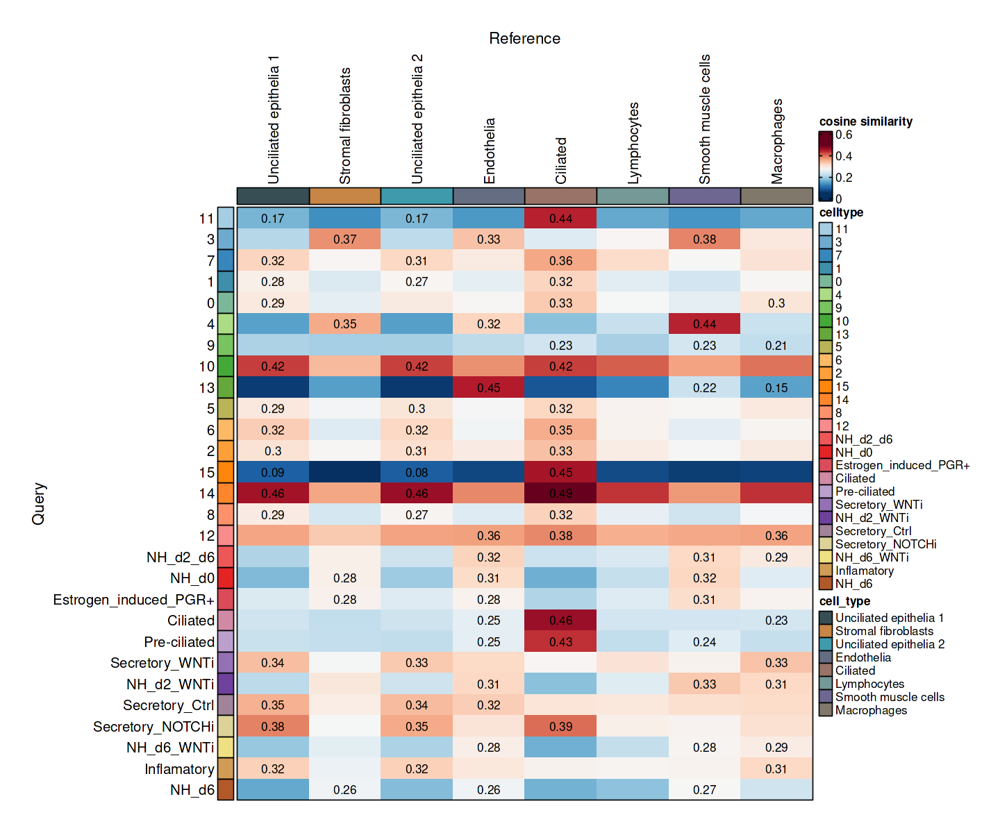

In [ ]:
# Calculate score for cosine similarity
ht <- CellCorHeatmap(
  srt_query = org_only.sct, srt_ref = wg_vv.downsized,
  query_group = "celltype", ref_group = "cell_type",
  nlabel = 3, label_by = "row",
  show_row_names = TRUE, show_column_names = TRUE
)
plot.width = 12
plot.height = 10
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
print(ht$plot)
ggsave(file="results/2023-03/heatmap_cosine_distance_org_wg_vv_ref.pdf", width = plot.width, height = plot.height)

Use the HVF to calculate distance metric.

Use 1409 common features to calculate distance.

Detected query data type: unknown

Detected reference data type: log_normalized_counts

Calculate similarity...

Use 'raw' method to find neighbors.

Predict cell type...



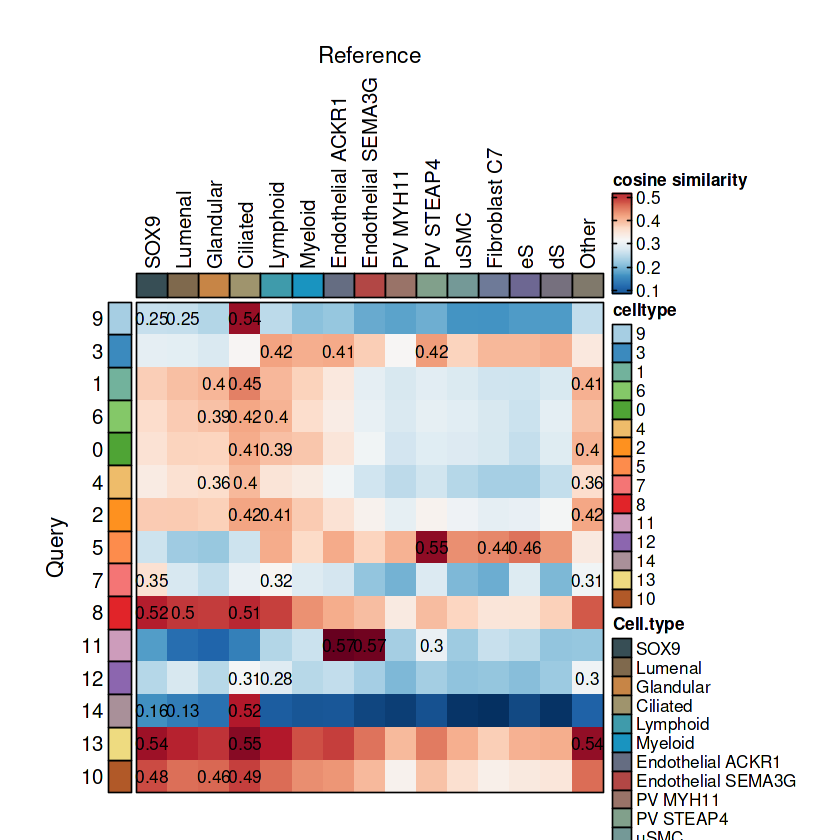

In [94]:
# Calculate score for cosine similarity
ht <- CellCorHeatmap(
  srt_query = ari_only.sct, srt_ref = ga_vv.downsized,
  query_group = "celltype", ref_group = "Cell.type",
  nlabel = 3, label_by = "row",
  show_row_names = TRUE, show_column_names = TRUE
)
plot.width = 7
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
print(ht$plot)
ggsave(file="results/2023-04-28/heatmap_cosine_distance_ari_ga_epi_only1.pdf", width = plot.width, height = plot.height)

Use the HVF to calculate distance metric.

Use 1975 common features to calculate distance.

Detected query data type: unknown

Detected reference data type: log_normalized_counts

Calculate similarity...

Use 'raw' method to find neighbors.

Predict cell type...



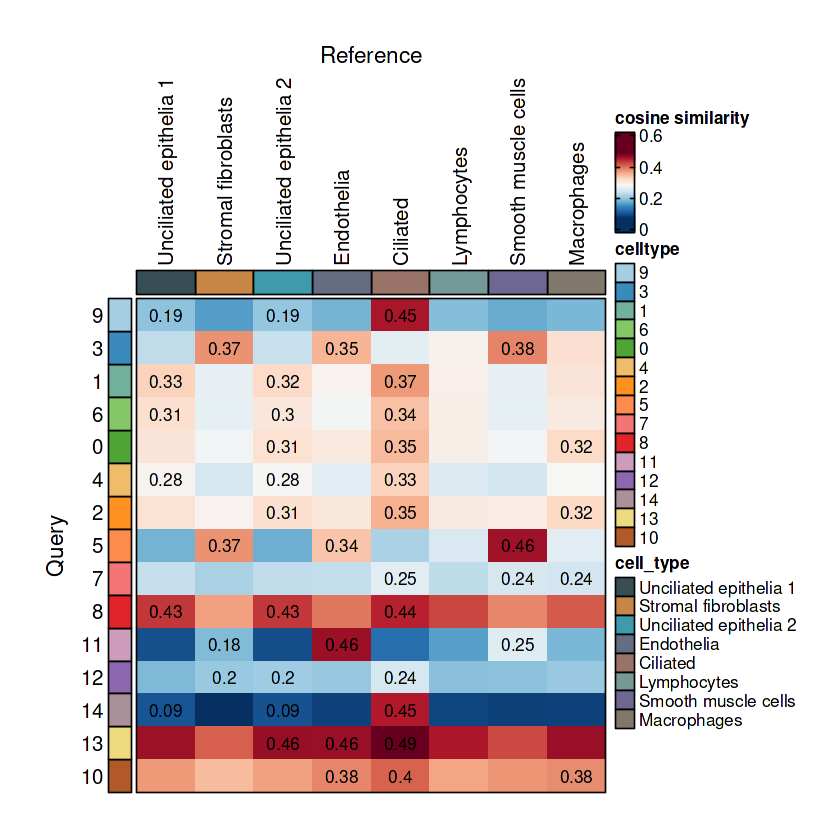

In [95]:
# Calculate score for cosine similarity
ht <- CellCorHeatmap(
  srt_query = ari_only.sct, srt_ref = wg_vv.downsized,
  query_group = "celltype", ref_group = "cell_type",
  nlabel = 3, label_by = "row",
  show_row_names = TRUE, show_column_names = TRUE
)
plot.width = 7
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
print(ht$plot)
ggsave(file="results/2023-04-28/heatmap_cosine_distance_ari_wg_epi_only1.pdf", width = plot.width, height = plot.height)

# Use the annotated to visualize the same plot

In [106]:
#ari_only.sct <- subset(so.combined.sct, subset = project == "ari_org")
table(ari_only.sct@meta.data$project)


ari_org 
  17537 

In [116]:
# confirm if get the names
table(ari_only.sct$celltype)


   0    1   10   11   12   13   14    2    3    4    5    6    7    8    9 
3756 2389  426  336  253  209   68 1931 1657 1654 1387 1262  816  779  614 

In [111]:
Idents(ari_only.sct) <- ari_only.sct$celltype

In [112]:
new.cluster.ids <- c("NH", #0
                     "LGR5+", #1
                     "Surface", #2
                     "Stromal", #3
                     "Glandular", #4
                     "PV-like", #5
                     "Luminal", #6
                     "Proliferative", #7
                     "Surface", #8
                     "Ciliated", #9
                     "10", #10
                     "Endo", #11
                     "NH", #12
                     "13", #13
                     "Ciliated" #14
)
names(new.cluster.ids) <- levels(ari_only.sct)
ari_only.sct <- RenameIdents(ari_only.sct, new.cluster.ids)

In [117]:
ari_only.sct$celltype <- Idents(ari_only.sct)

In [114]:
table(Idents(ari_only.sct))


           NH         LGR5+       Surface       Stromal     Glandular 
          682          1657          3205          1262          3756 
      PV-like       Luminal Proliferative      Ciliated            10 
         1654          1931          1387          1205           336 
         Endo            13 
          253           209 

Use the HVF to calculate distance metric.

Use 1409 common features to calculate distance.

Detected query data type: unknown

Detected reference data type: log_normalized_counts

Calculate similarity...

Use 'raw' method to find neighbors.

Predict cell type...



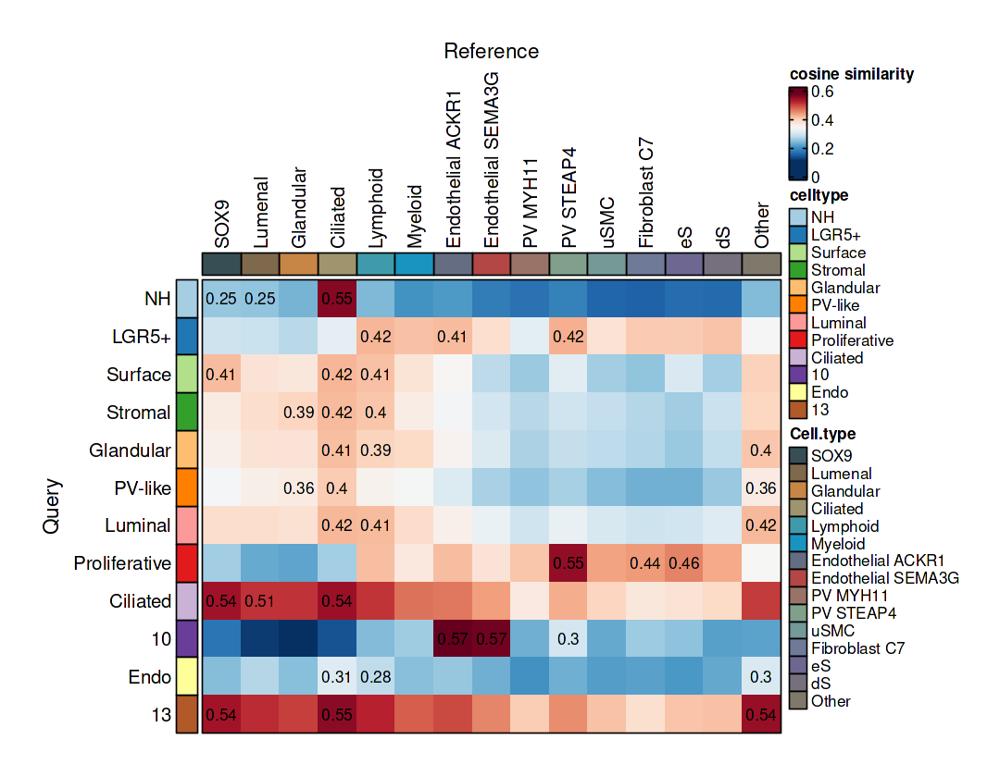

In [122]:
# Calculate score for cosine similarity
ht <- CellCorHeatmap(
  srt_query = ari_only.sct, srt_ref = ga_vv.downsized,
  query_group = "celltype", ref_group = "Cell.type",
  nlabel = 3, label_by = "row",
  show_row_names = TRUE, show_column_names = TRUE
)
plot.width = 9
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
print(ht$plot)
ggsave(file="results/2023-04-28/Fig3_I_ga_vv_2.pdf", width = plot.width, height = plot.height)

Use the HVF to calculate distance metric.

Use 1975 common features to calculate distance.

Detected query data type: unknown

Detected reference data type: log_normalized_counts

Calculate similarity...

Use 'raw' method to find neighbors.

Predict cell type...



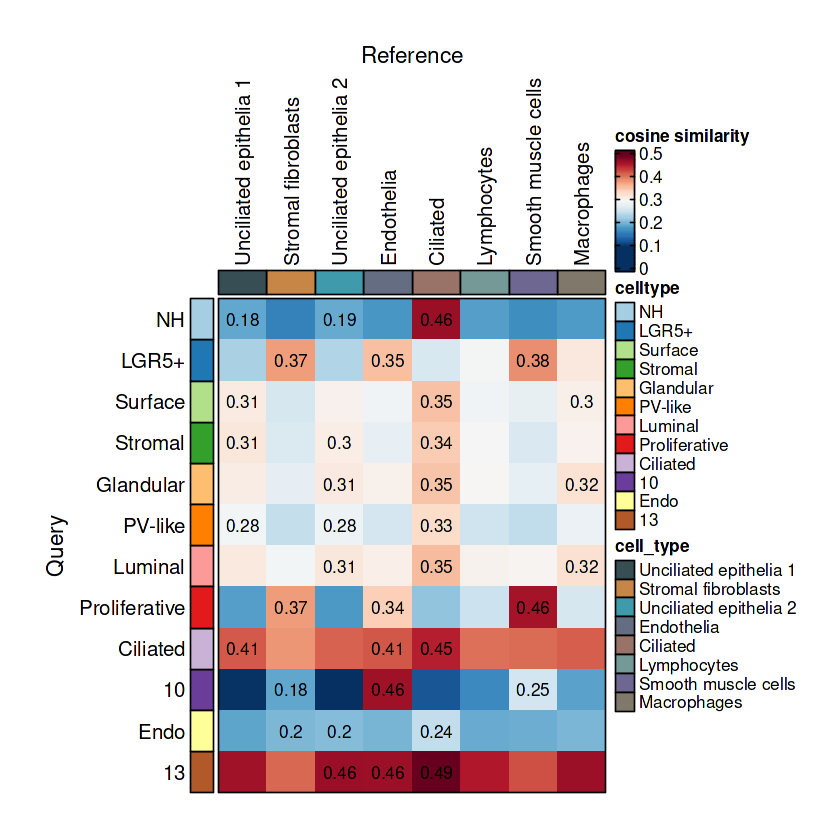

In [120]:
# Calculate score for cosine similarity
ht <- CellCorHeatmap(
  srt_query = ari_only.sct, srt_ref = wg_vv.downsized,
  query_group = "celltype", ref_group = "cell_type",
  nlabel = 3, label_by = "row",
  show_row_names = TRUE, show_column_names = TRUE
)
plot.width = 7
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
print(ht$plot)
ggsave(file="results/2023-04-28/Fig3_I_wg_vv_2.pdf", width = plot.width, height = plot.height)

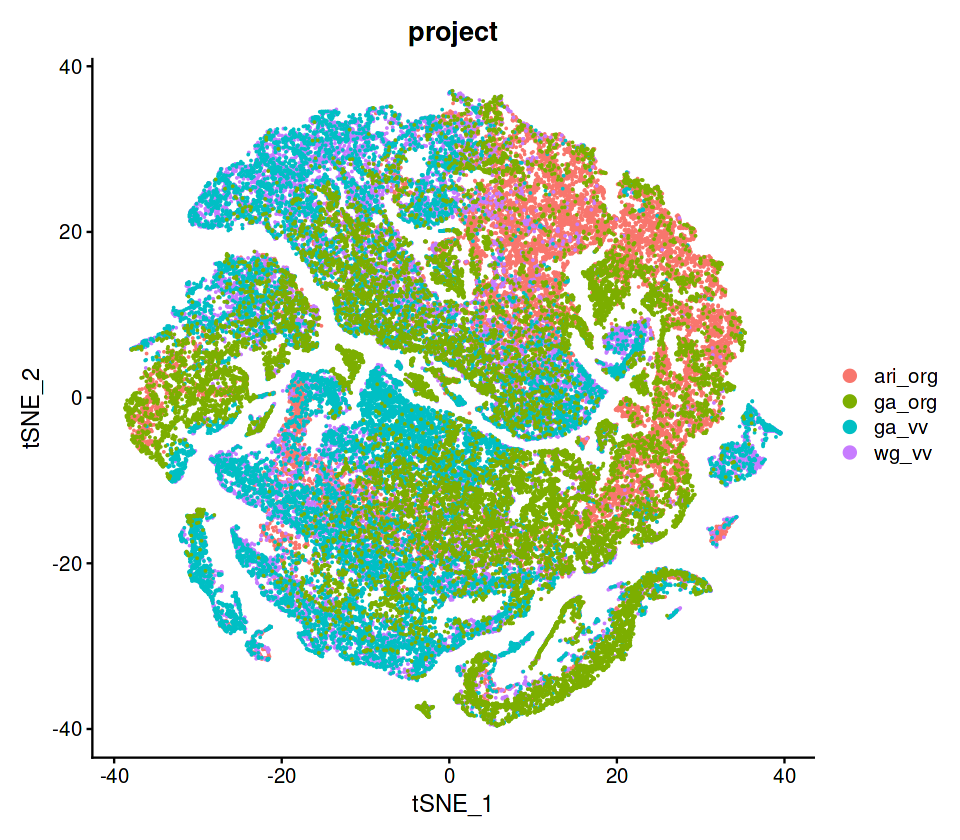

In [123]:
# tSNE plots
plot.width = 8
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "tsne", group.by = "project")
ggsave(file="results/2023-03/integration_all_downsized_tsne1.pdf", width = plot.width, height = plot.height)

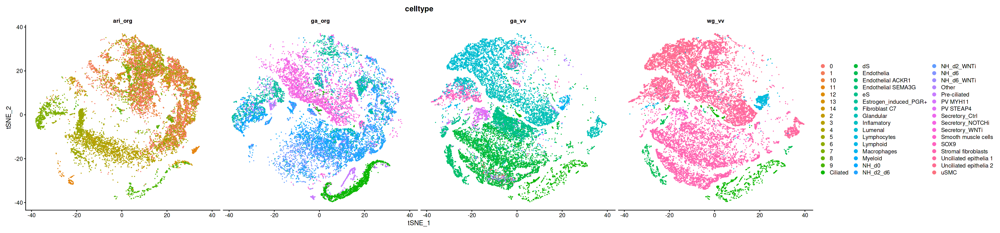

In [124]:
plot.width = 30
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "tsne", group.by = "celltype", split.by = "project")
ggsave(file="results/2023-03/integration_all_downsized_tsne2_split_by_project_with_labels1.pdf", width = plot.width, height = plot.height)

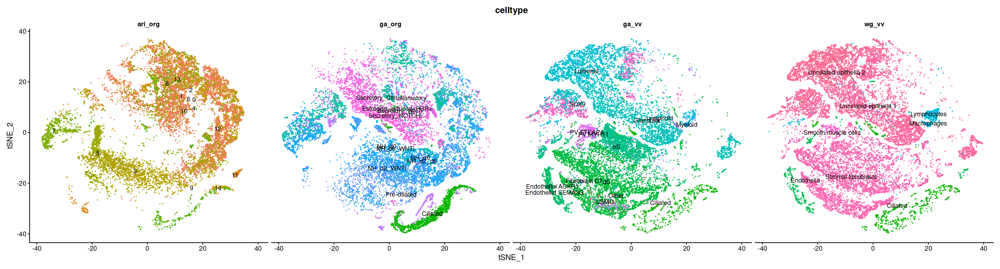

In [125]:
plot.width = 26
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "tsne", group.by = "celltype", split.by = "project", label = TRUE) + NoLegend()
ggsave(file="results/2023-03/integration_all_downsized_tsne2_split_by_project_with_labels2.pdf", width = plot.width, height = plot.height)

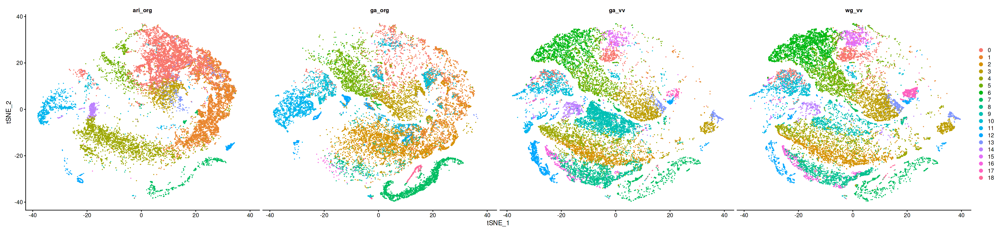

In [126]:
plot.width = 30
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "tsne", split.by = "project")
ggsave(file="results/2023-03/integration_all_downsized_tsne2_split_by_project_with_labels3.pdf", width = plot.width, height = plot.height)

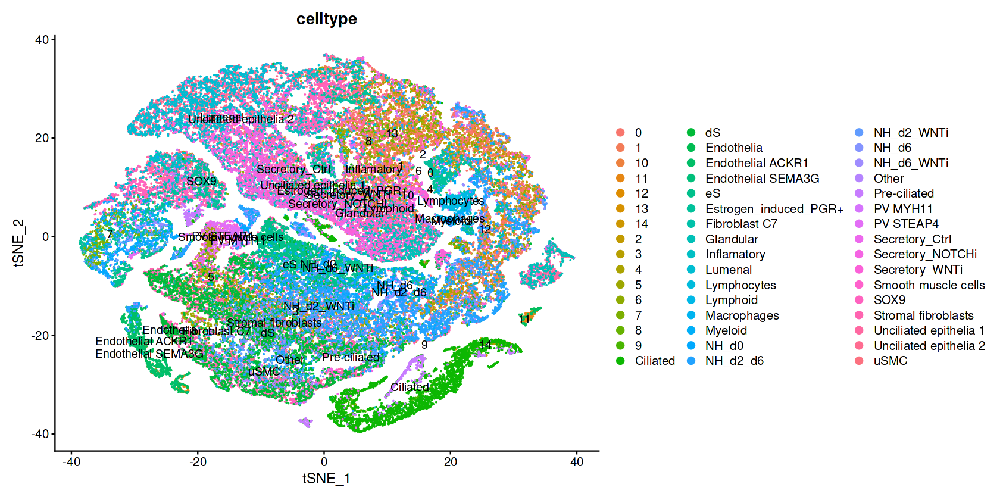

In [127]:
plot.width = 14
plot.height = 7
options(repr.plot.width = plot.width, repr.plot.height = plot.height)
DimPlot(so.combined.sct, reduction = "tsne", group.by = "celltype", label = TRUE, repel = FALSE)
ggsave(file="results/2023-03/integration_all_downsized_tsne3_with_labels.pdf", width = plot.width, height = plot.height)

In [128]:
# Save the current object before renaming the clusters
saveRDS(so.combined.sct, file = "results/2023-03/integrated_all_downsized.rds")

# Save the entire workspace
save.image(file = "results/2023-03/integrated_all_downsized.RData")

In [129]:
sessionInfo()

R version 4.2.2 Patched (2022-11-10 r83330)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Ubuntu 20.04.5 LTS

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/atlas/libblas.so.3.10.3
LAPACK: /usr/lib/x86_64-linux-gnu/atlas/liblapack.so.3.10.3

locale:
 [1] LC_CTYPE=C.UTF-8       LC_NUMERIC=C           LC_TIME=C.UTF-8       
 [4] LC_COLLATE=C.UTF-8     LC_MONETARY=C.UTF-8    LC_MESSAGES=C.UTF-8   
 [7] LC_PAPER=C.UTF-8       LC_NAME=C              LC_ADDRESS=C          
[10] LC_TELEPHONE=C         LC_MEASUREMENT=C.UTF-8 LC_IDENTIFICATION=C   

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] colorspace_2.1-0      SCP_0.2.7             dplyr_1.1.1          
 [4] SeuratWrappers_0.3.1  Matrix_1.5-3          cowplot_1.1.1        
 [7] ggplot2_3.4.1         patchwork_1.1.2       RColorBrewer_1.1-3   
[10] SeuratDisk_0.0.0.9020 SeuratObject_4.1.3    Seurat_4.3.0         

loaded via a namespace (